In [1]:
import numpy as np
import pandas as pd

# Get Data

In [2]:
df = pd.read_csv('../../../Data/Whales/train.csv')
df['imgarray']=0
df['imgarray'] = df['imgarray'].astype(object)

In [3]:
df1,df2,df3 = np.array_split(df, 3)

In [4]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8454 entries, 0 to 8453
Data columns (total 3 columns):
Image       8454 non-null object
Id          8454 non-null object
imgarray    8454 non-null object
dtypes: object(3)
memory usage: 198.2+ KB


In [5]:
import os
from PIL import Image
import glob
import cv2 as cv2
import matplotlib.pyplot as plt
from tqdm import tqdm


In [6]:
with tqdm(total=len(list(df1.iterrows()))) as pbar:
    for index, row in df1.iterrows():
        pbar.update(1)
        #print(row['Image'])
        im=cv2.imread(('../../../Data/Whales/train/' + row['Image']),0)
        #fileimg = np.asarray(im)
#        im.close()
        df1.at[index, 'imgarray'] = im
os.system('spd-say "Dataframe 1 is completed"')

100%|██████████| 8454/8454 [00:24<00:00, 347.75it/s]


0

In [7]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8454 entries, 0 to 8453
Data columns (total 3 columns):
Image       8454 non-null object
Id          8454 non-null object
imgarray    8454 non-null object
dtypes: object(3)
memory usage: 198.2+ KB


In [8]:
len(df1['Id'].unique())

2778

In [9]:
df1['Id'].value_counts().head()

new_whale    3281
w_23a388d      23
w_9b5109b      22
w_0369a5c      19
w_88e4537      18
Name: Id, dtype: int64

In [10]:
dfwhale = df1[df1['Id']=='w_23a388d']
dfwhale =dfwhale.reset_index()

In [11]:
len(dfwhale.head(5))

5

In [12]:
len(dfwhale)

23

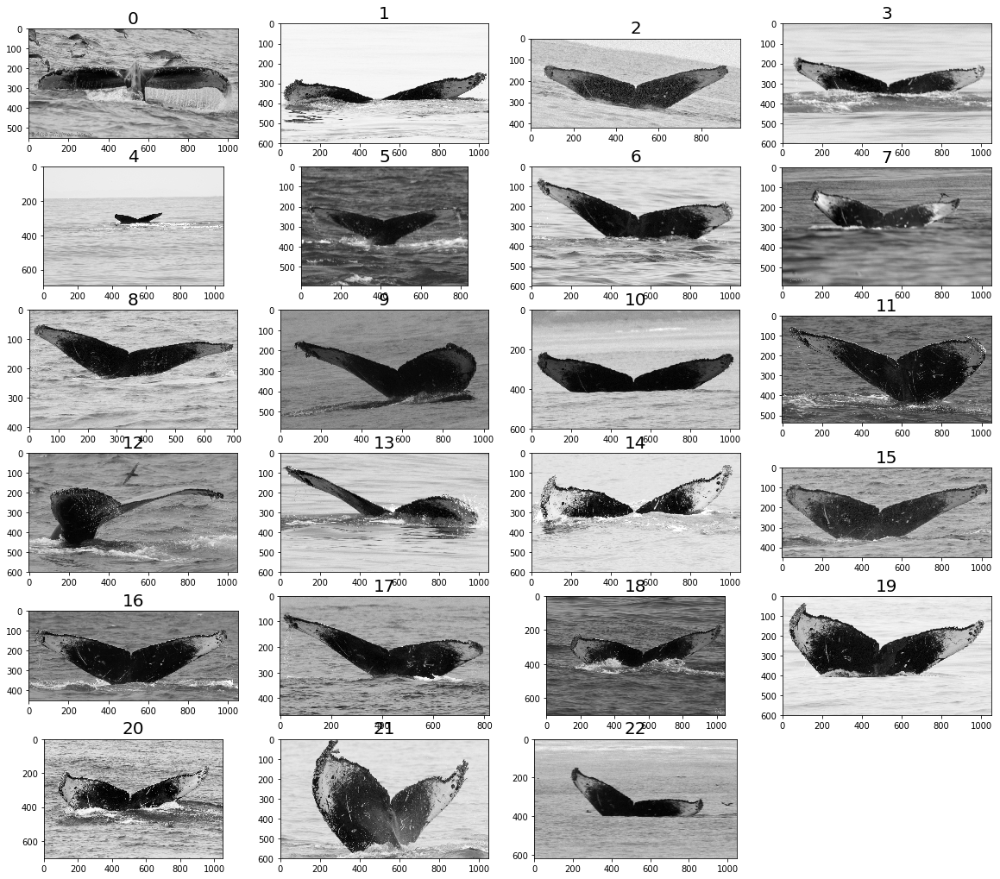

In [13]:
plt.figure(figsize=(20,30))
for i in range(len(dfwhale)):
    plt.subplot(10,4,i+1)
    plt.title(str(i), fontsize=20)
    plt.imshow(dfwhale.at[i, 'imgarray'],cmap='gray')

In [14]:
img1 = dfwhale.at[19, 'imgarray']
img2 = dfwhale.at[20, 'imgarray']
img3 = dfwhale.at[2, 'imgarray']

# Possible Preprocessing

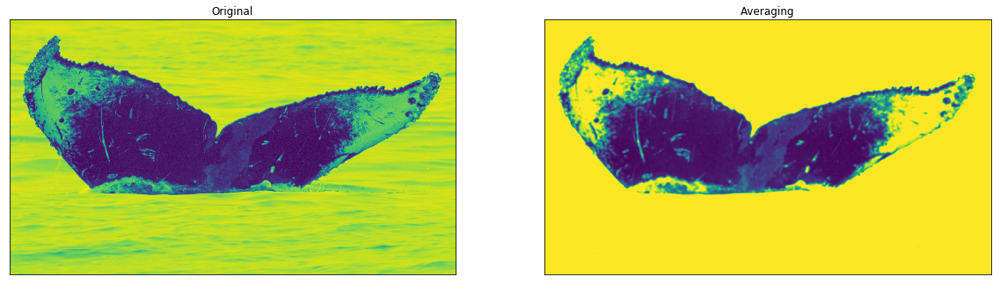

In [15]:
plt.figure(figsize=(20,30))
kernel = np.ones((5,5),np.float32)/17
dst1 = cv2.filter2D(img1,0,kernel)

plt.subplot(121),plt.imshow(img1),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst1),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()

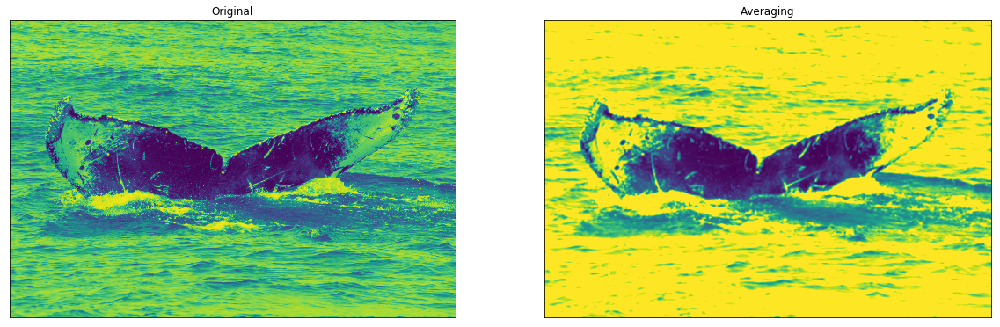

In [16]:
plt.figure(figsize=(20,30))
kernel = np.ones((5,5),np.float32)/17
dst2 = cv2.filter2D(img2,0,kernel)

plt.subplot(121),plt.imshow(img2),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst2),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()

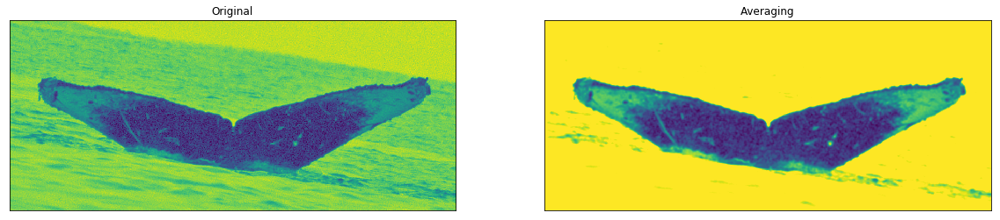

In [17]:
plt.figure(figsize=(20,30))
kernel = np.ones((5,5),np.float32)/17
dst3 = cv2.filter2D(img3,0,kernel)

plt.subplot(121),plt.imshow(img3),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst3),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()

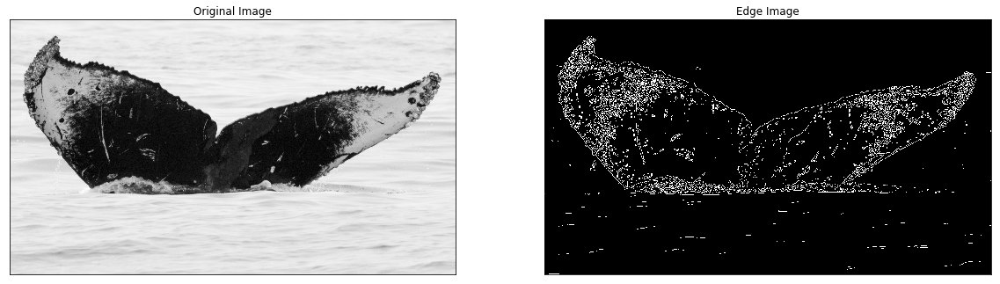

In [18]:
plt.figure(figsize=(20,30))
edges = cv2.Canny(img1,70,100)

plt.subplot(121),plt.imshow(img1,cmap = 'gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(edges,cmap = 'gray')
plt.title('Edge Image'), plt.xticks([]), plt.yticks([])

plt.show()

In [19]:
# Make new column

dfwhale['filtered']=0
dfwhale['filtered'] = dfwhale['filtered'].astype(object)

In [20]:
# Process images and save in tehhe olumn
kernel = np.ones((5,5),np.float32)/17
with tqdm(total=len(list(dfwhale.iterrows()))) as pbar:
    for index, row in dfwhale.iterrows():
        pbar.update(1)
        im = dfwhale.at[index, 'imgarray']
        filtered = cv2.filter2D(im,0,kernel)
        dfwhale.at[index, 'filtered'] = filtered
os.system('spd-say "Processing complete"')

100%|██████████| 23/23 [00:00<00:00, 299.34it/s]


0

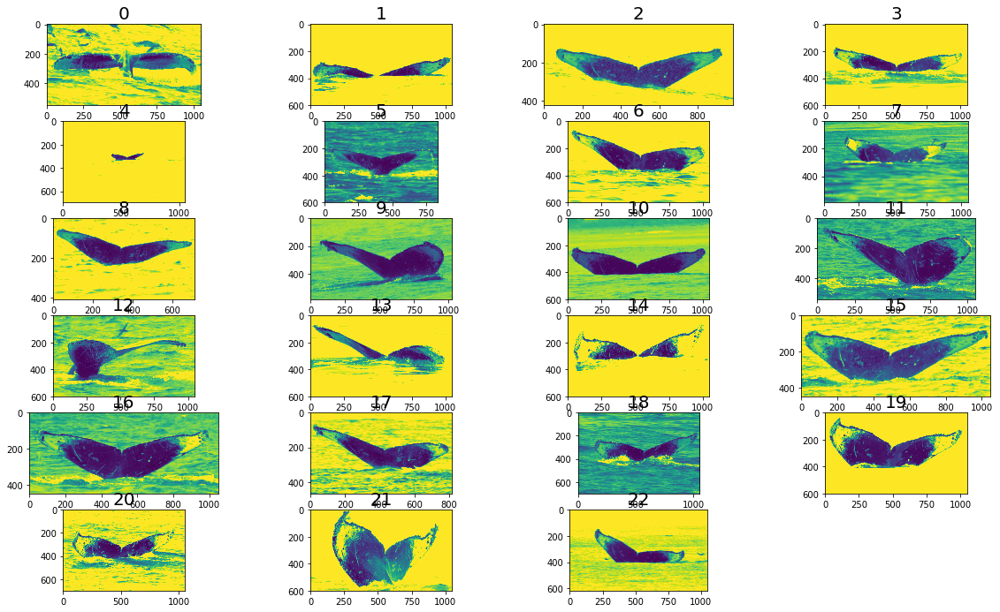

In [21]:
plt.figure(figsize=(20,30))
for i in range(len(dfwhale)):
    plt.subplot(15,4,i+1)
    plt.title(str(i), fontsize=20)
    plt.imshow(dfwhale.at[i, 'filtered'])

# Using ORB

In [359]:
img1 = dfwhale.at[19, 'filtered']
img2 = dfwhale.at[20, 'filtered']
img3 = dfwhale.at[11, 'filtered']

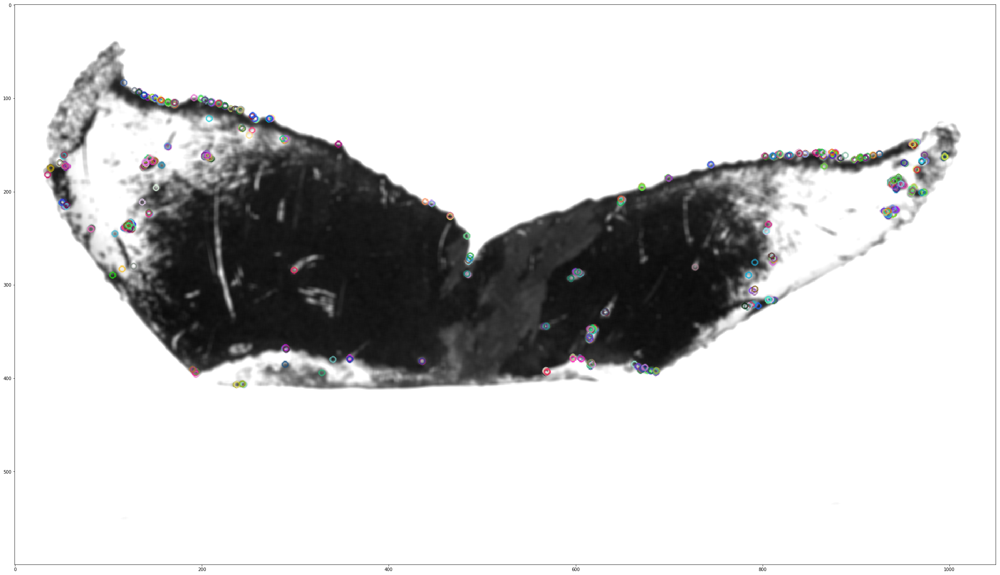

(<matplotlib.image.AxesImage at 0x7f917b4390b8>, None)

In [360]:
plt.figure(figsize=(40,30))

# Initiate ORB detector
orb = cv2.ORB_create()

# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)
kp3, des3 = orb.detectAndCompute(img3,None)

#cv2.drawKeypoints(img_building, key_points, img_building, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

imgtest1 = cv2.drawKeypoints(img1,kp1, None)
imgtest2 = cv2.drawKeypoints(img2,kp2, None)
imgtest3 = cv2.drawKeypoints(img3,kp3, None)

plt.imshow(imgtest1,),plt.show()

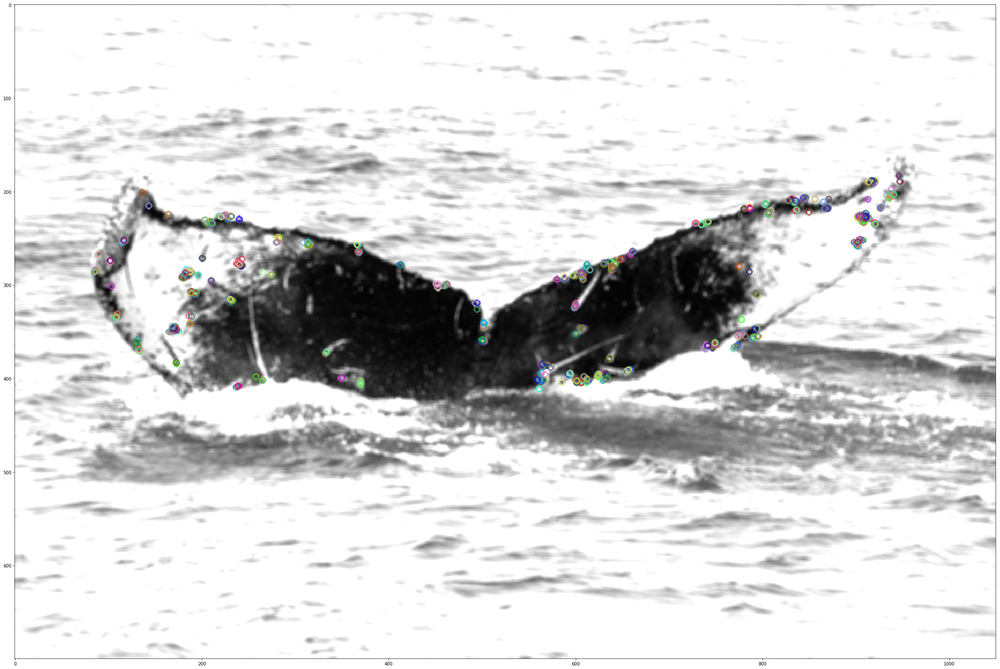

(<matplotlib.image.AxesImage at 0x7f9179beda20>, None)

In [361]:
plt.figure(figsize=(40,30))
plt.imshow(imgtest2,),plt.show()

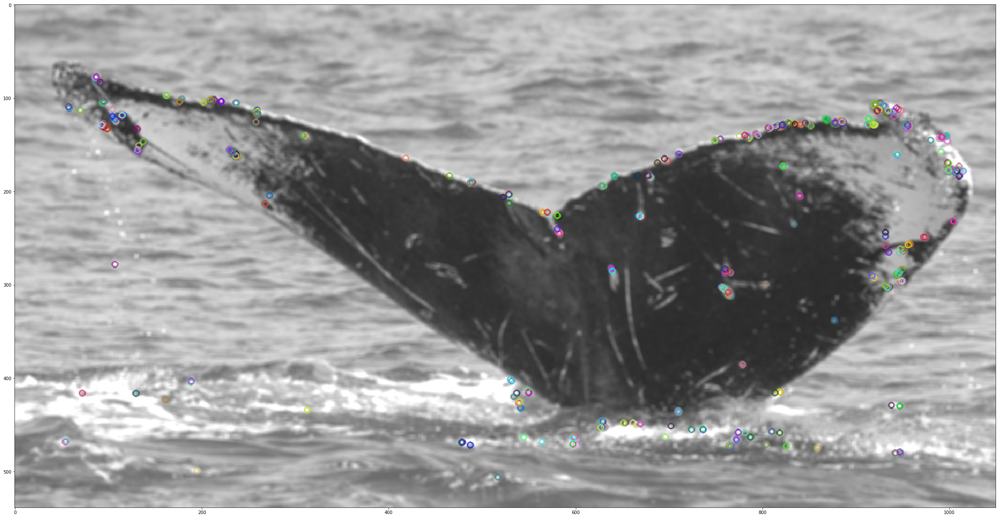

(<matplotlib.image.AxesImage at 0x7f9179bc5dd8>, None)

In [362]:
plt.figure(figsize=(40,30))
plt.imshow(imgtest3,),plt.show()

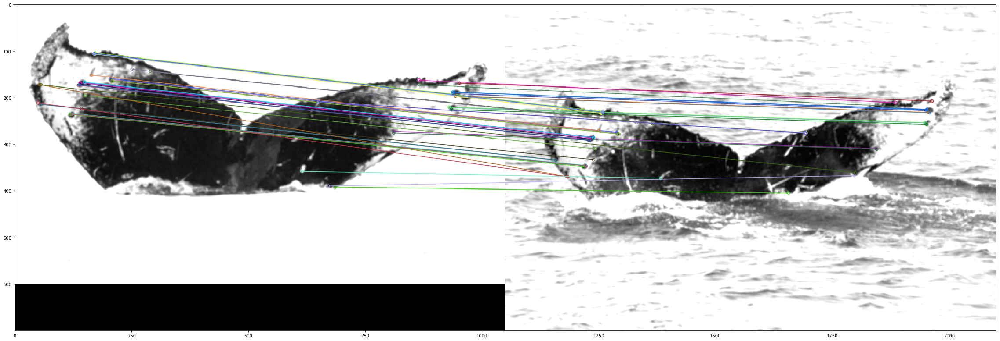

(<matplotlib.image.AxesImage at 0x7f9179b00a58>, None)

In [364]:
plt.figure(figsize=(40,30))

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(des1,des2)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
matchimg = cv2.drawMatches(img1,kp1,img2,kp2,matches[:50] ,None, flags=2)

plt.imshow(matchimg),plt.show()

In [365]:
matches[40].distance

39.0

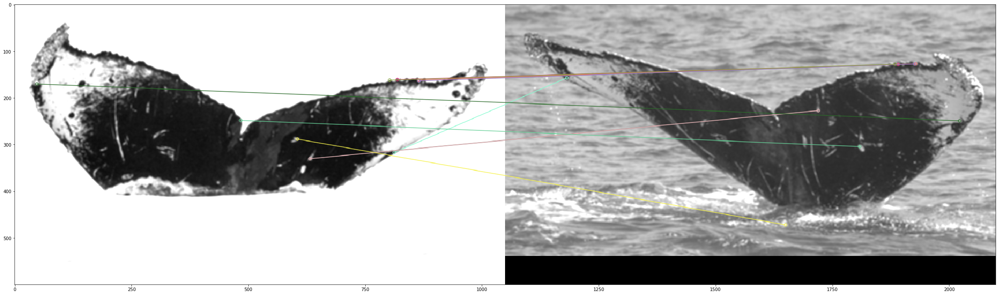

(<matplotlib.image.AxesImage at 0x7f9179a3eda0>, None)

In [367]:
plt.figure(figsize=(40,30))

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1,des3)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
matchimg2 = cv2.drawMatches(img1,kp1,img3,kp3,matches[:10],None, flags=2)

plt.imshow(matchimg2),plt.show()

# Using SIFT

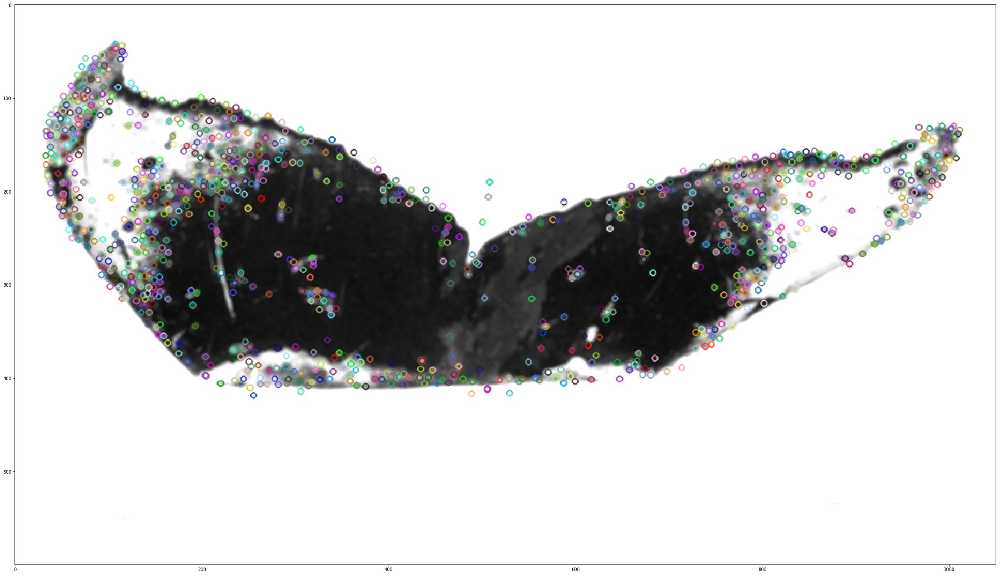

(<matplotlib.image.AxesImage at 0x7f91d07a7940>, None)

In [127]:
plt.figure(figsize=(40,30))

# Initiate SIFT detector
sift = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with sift
kp1, des1 = sift.detectAndCompute(img1,None)
kp2, des2 = sift.detectAndCompute(img2,None)
kp3, des3 = sift.detectAndCompute(img3,None)

imgtest1 = cv2.drawKeypoints(img1,kp1, None)
imgtest2 = cv2.drawKeypoints(img2,kp2, None)
imgtest3 = cv2.drawKeypoints(img3,kp3, None)

plt.imshow(imgtest1,),plt.show()

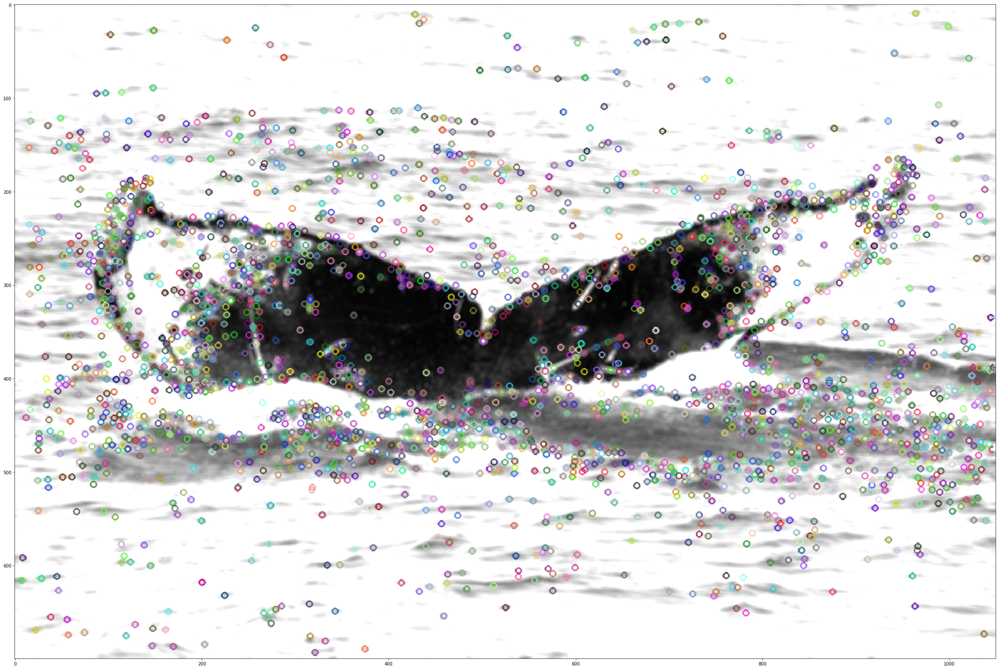

(<matplotlib.image.AxesImage at 0x7f91d077ad30>, None)

In [128]:
plt.figure(figsize=(40,30))
plt.imshow(imgtest2,),plt.show()

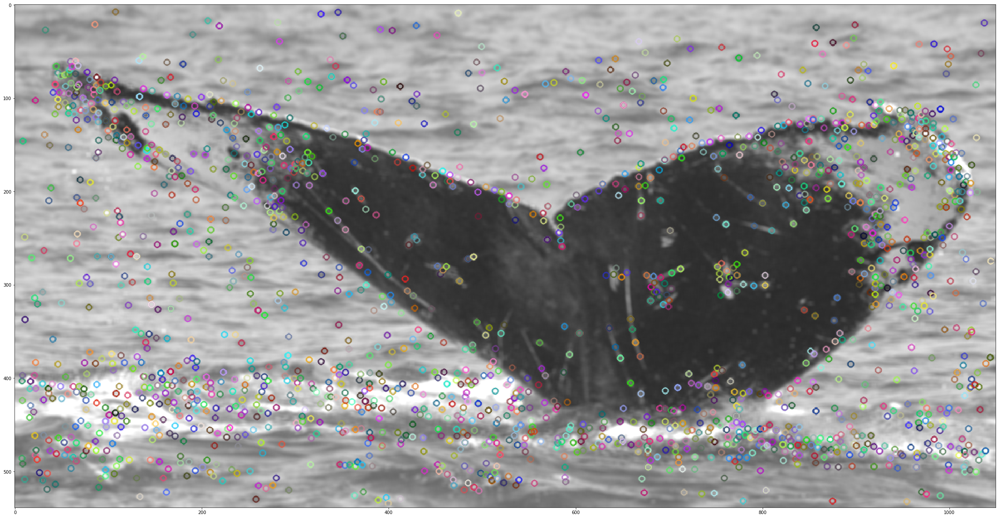

(<matplotlib.image.AxesImage at 0x7f91d06da2b0>, None)

In [129]:
plt.figure(figsize=(40,30))
plt.imshow(imgtest3,),plt.show()

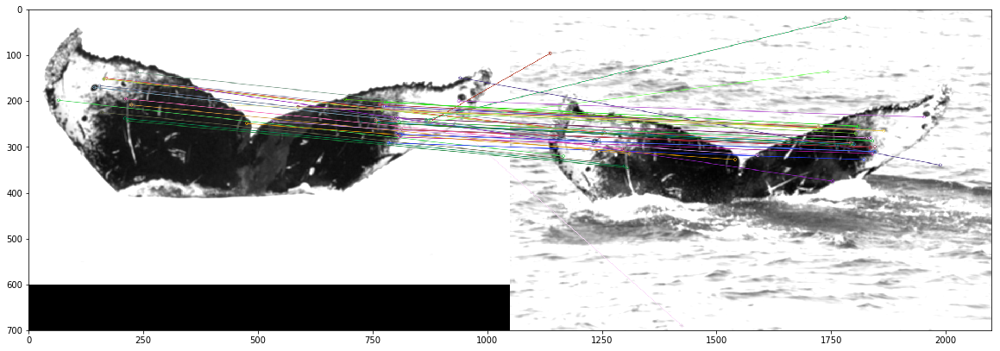

(<matplotlib.image.AxesImage at 0x7f91d06bbbe0>, None)

In [130]:
plt.figure(figsize=(20,20))

bf = cv2.FlannBasedMatcher()

# Match descriptors.
matches = bf.match(des1,des2)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
matchimg = cv2.drawMatches(img1,kp1,img2,kp2,matches[:50],None, flags=2)

plt.imshow(matchimg),plt.show()

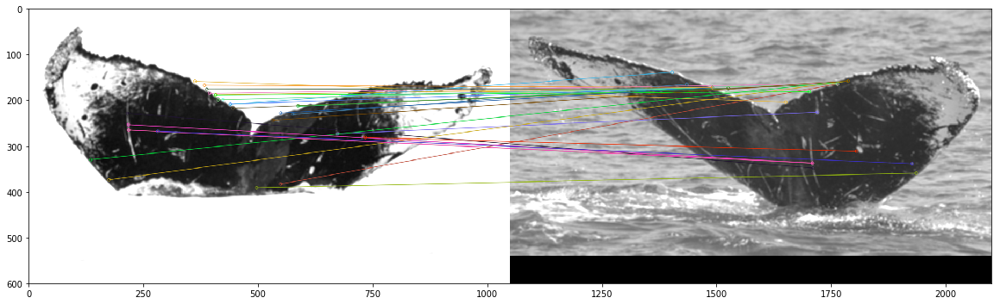

(<matplotlib.image.AxesImage at 0x7f91d0624240>, None)

In [131]:
plt.figure(figsize=(20,20))

bf = cv2.FlannBasedMatcher()

# Match descriptors.
matches = bf.match(des1,des3)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
matchimg = cv2.drawMatches(img1,kp1,img3,kp3,matches[:30],None, flags=2)

plt.imshow(matchimg),plt.show()

# Using SURF

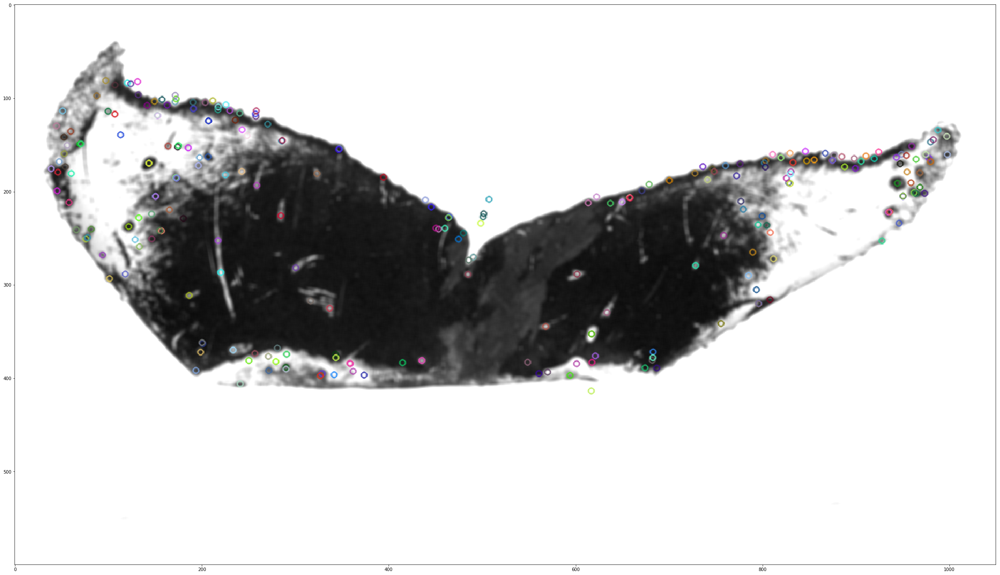

(<matplotlib.image.AxesImage at 0x7f91d05e55c0>, None)

In [132]:
plt.figure(figsize=(40,30))

# Initiate SIFT detector
surf = cv2.xfeatures2d.SURF_create(7000)

# find the keypoints and descriptors with sift
kp1, des1 = surf.detectAndCompute(img1,None)
kp2, des2 = surf.detectAndCompute(img2,None)
kp3, des3 = surf.detectAndCompute(img3,None)

imgtest1 = cv2.drawKeypoints(img1,kp1, None)
imgtest2 = cv2.drawKeypoints(img2,kp2, None)
imgtest3 = cv2.drawKeypoints(img3,kp3, None)

plt.imshow(imgtest1,),plt.show()

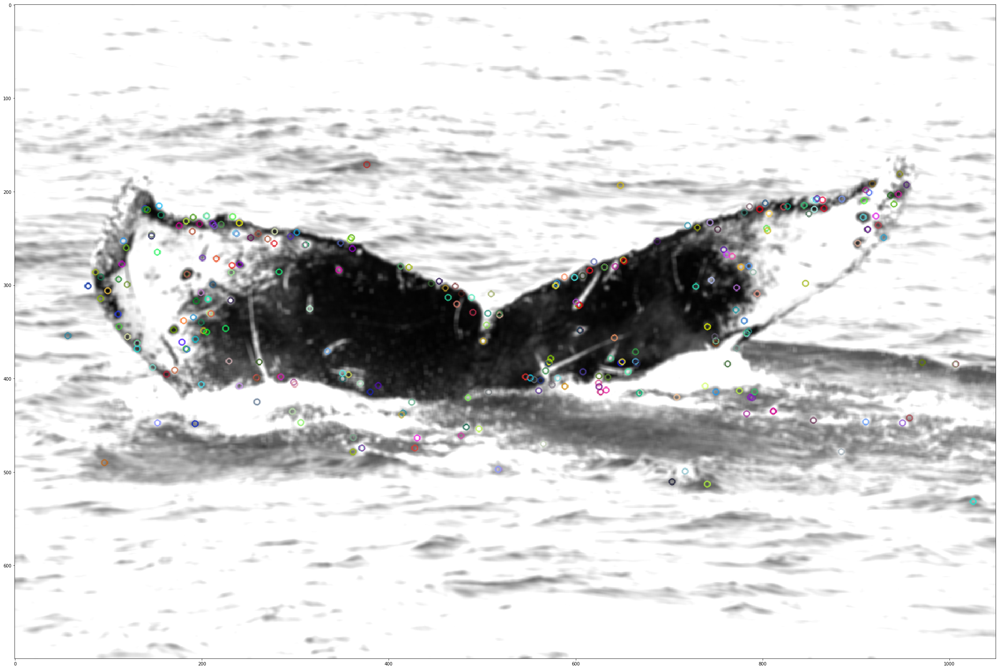

(<matplotlib.image.AxesImage at 0x7f91d0595b70>, None)

In [133]:
plt.figure(figsize=(40,30))
plt.imshow(imgtest2,),plt.show()

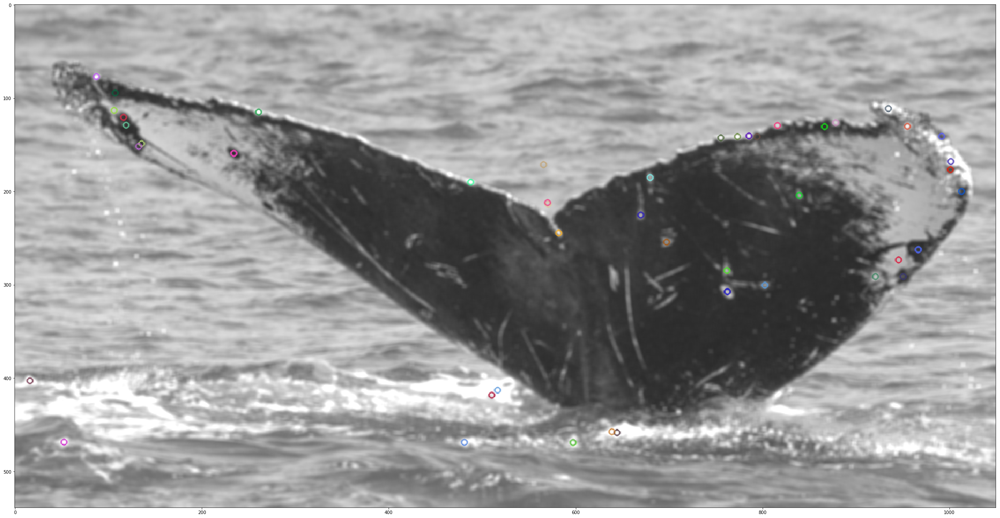

(<matplotlib.image.AxesImage at 0x7f91d056cf60>, None)

In [134]:
plt.figure(figsize=(40,30))
plt.imshow(imgtest3,),plt.show()

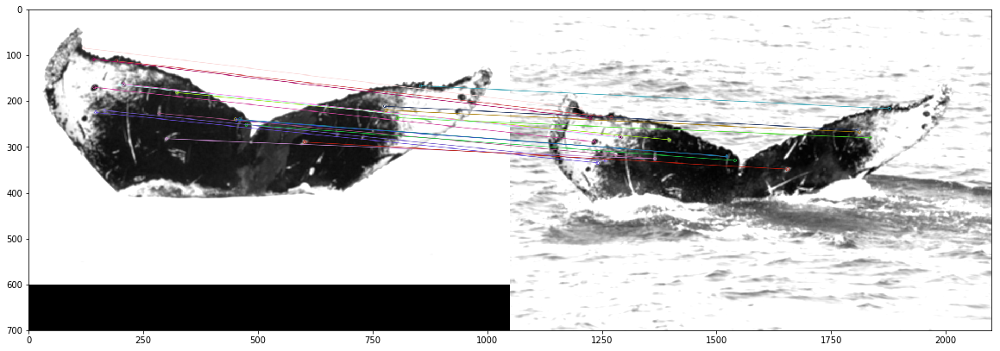

(<matplotlib.image.AxesImage at 0x7f91d04c0828>, None)

In [135]:
plt.figure(figsize=(20,20))

bf = cv2.FlannBasedMatcher()

# Match descriptors.
matches = bf.match(des1,des2)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
matchimg = cv2.drawMatches(img1,kp1,img2,kp2,matches[:20],None, flags=2)

plt.imshow(matchimg),plt.show()

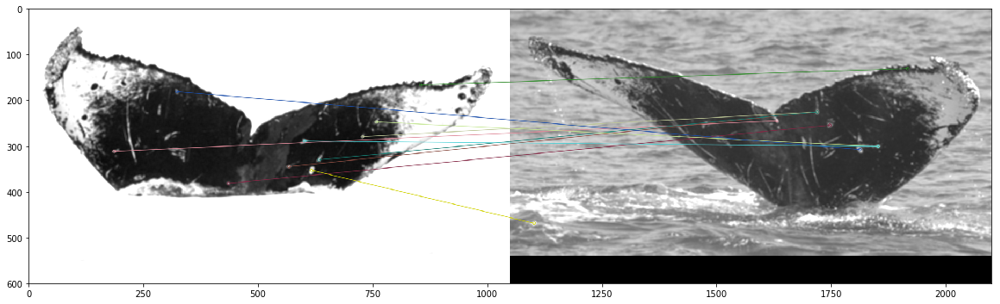

(<matplotlib.image.AxesImage at 0x7f91d04a1da0>, None)

In [136]:
plt.figure(figsize=(20,20))

bf = cv2.FlannBasedMatcher()

# Match descriptors.
matches = bf.match(des1,des3)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
matchimg = cv2.drawMatches(img1,kp1,img3,kp3,matches[:10],None, flags=2)

plt.imshow(matchimg),plt.show()

In [137]:
matches[0].distance

0.1215730607509613

In [138]:
des1

array([[ 9.1302267e-04,  3.1696530e-03,  2.8873030e-03, ...,
        -1.4393348e-05,  1.4420144e-05,  1.9910887e-05],
       [-1.8875308e-03, -2.9943946e-03,  4.0726019e-03, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [-3.9884201e-03, -3.0816479e-03,  4.2313966e-03, ...,
        -2.3230694e-03,  4.4086590e-04,  2.3230694e-03],
       ...,
       [ 4.5182067e-03, -1.6731183e-03,  6.3763992e-03, ...,
         9.7244675e-04,  1.9269872e-03,  1.5453104e-03],
       [-1.8399183e-03, -5.7177863e-04,  2.2871064e-03, ...,
         0.0000000e+00,  0.0000000e+00,  0.0000000e+00],
       [-1.6216063e-03,  1.7684346e-04,  3.2034027e-03, ...,
        -5.0661847e-04,  1.1733813e-03,  1.2425135e-03]], dtype=float32)

In [139]:
kp1[1]

<KeyPoint 0x7f91ee6818a0>

# Homography

In [41]:
imgtest1 = dfwhale.at[19, 'filtered']
imgtest2 = dfwhale.at[21, 'filtered']


In [42]:
MIN_MATCH_COUNT = 10

# Initiate SIFT detector
sift = cv2.xfeatures2d.SIFT_create(nfeatures=500)
#orb = cv2.ORB_create()

# find the keypoints and descriptors with SIFT
kp1, des1 = sift.detectAndCompute(imgtest1,None)
kp2, des2 = sift.detectAndCompute(imgtest2,None)

FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 500)

flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(des1,des2,k=2)

# store all the good matches as per Lowe's ratio test.
good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)


In [43]:
if len(good)>MIN_MATCH_COUNT:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)

    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
    matchesMask = mask.ravel().tolist()

    h,w = imgtest1.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,M)

    imgtest2 = cv2.polylines(imgtest2,[np.int32(dst)],True,(100,200,100), 3, cv2.LINE_AA)

else:
    print("Failed")
    matchesMask = None

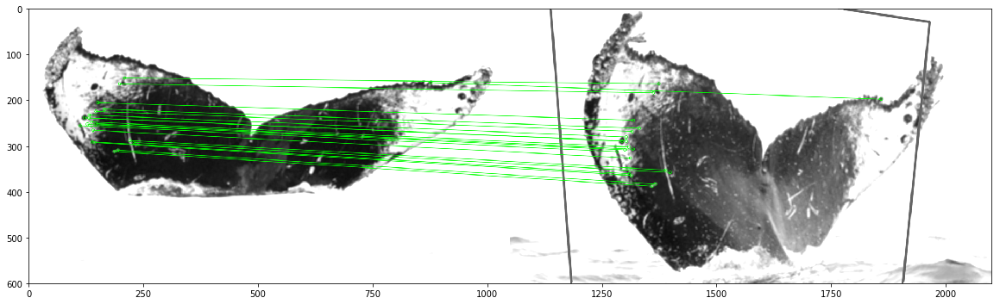

(<matplotlib.image.AxesImage at 0x7f91ec9d1358>, None)

In [44]:

plt.figure(figsize=(20,15))
draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)

newimg = cv2.drawMatches(imgtest1,kp1,imgtest2,kp2,good,None,**draw_params)

plt.imshow(newimg, 'gray'),plt.show()


# Different Whale

In [45]:
df1['Id'].value_counts().head()

new_whale    3281
w_23a388d      23
w_9b5109b      22
w_0369a5c      19
w_88e4537      18
Name: Id, dtype: int64

In [50]:
dfwhale2 = df1[df1['Id']=='w_0369a5c']

In [51]:
dfwhale2 =dfwhale2.reset_index()

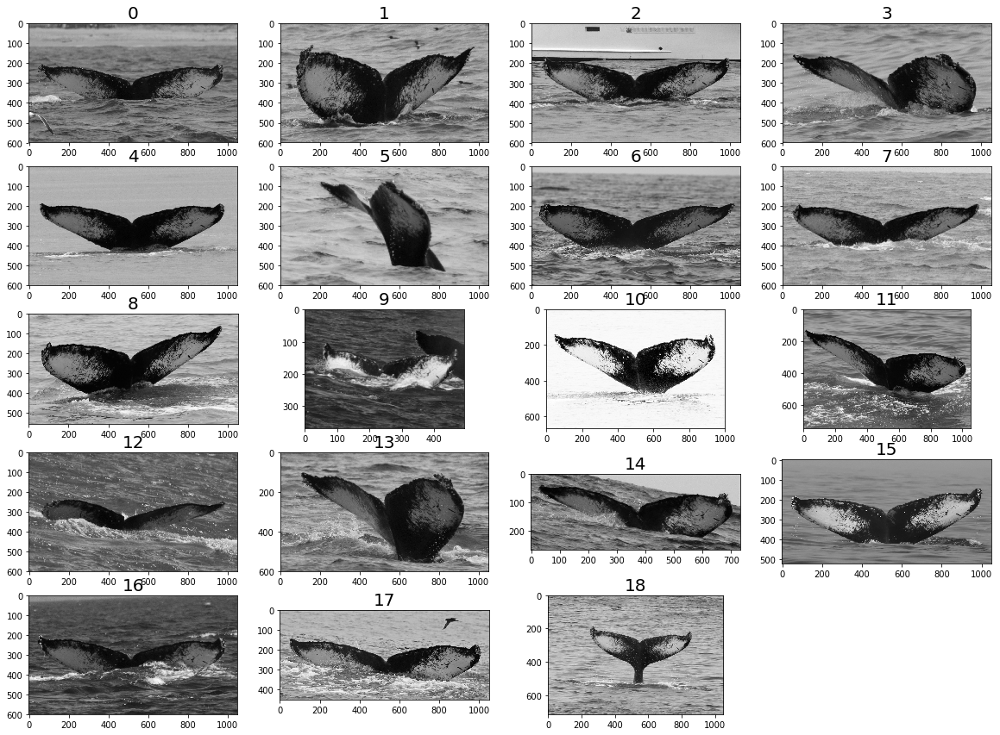

In [52]:
plt.figure(figsize=(20,30))
for i in range(len(dfwhale2)):
    plt.subplot(10,4,i+1)
    plt.title(str(i), fontsize=20)
    plt.imshow(dfwhale2.at[i, 'imgarray'],cmap='gray')

In [141]:
img1 = dfwhale.at[19, 'imgarray']
img2 = dfwhale2.at[18, 'imgarray']

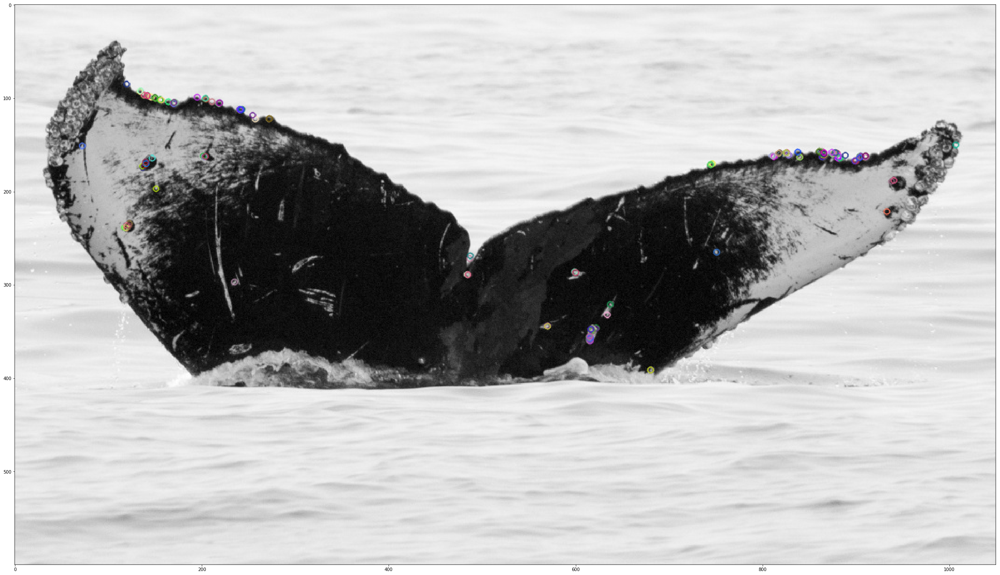

(<matplotlib.image.AxesImage at 0x7f91d01710b8>, None)

In [182]:
plt.figure(figsize=(40,30))

# Initiate ORB detector
orb = cv2.ORB_create(nfeatures=150)

# find the keypoints and descriptors with ORB
kp1, des1 = orb.detectAndCompute(img1,None)
kp2, des2 = orb.detectAndCompute(img2,None)
#kp3, des3 = orb.detectAndCompute(img3,None)

#cv2.drawKeypoints(img_building, key_points, img_building, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

imgtest1 = cv2.drawKeypoints(img1,kp1, None)
imgtest2 = cv2.drawKeypoints(img2,kp2, None)
#imgtest3 = cv2.drawKeypoints(img3,kp3, None)

plt.imshow(imgtest1,),plt.show()

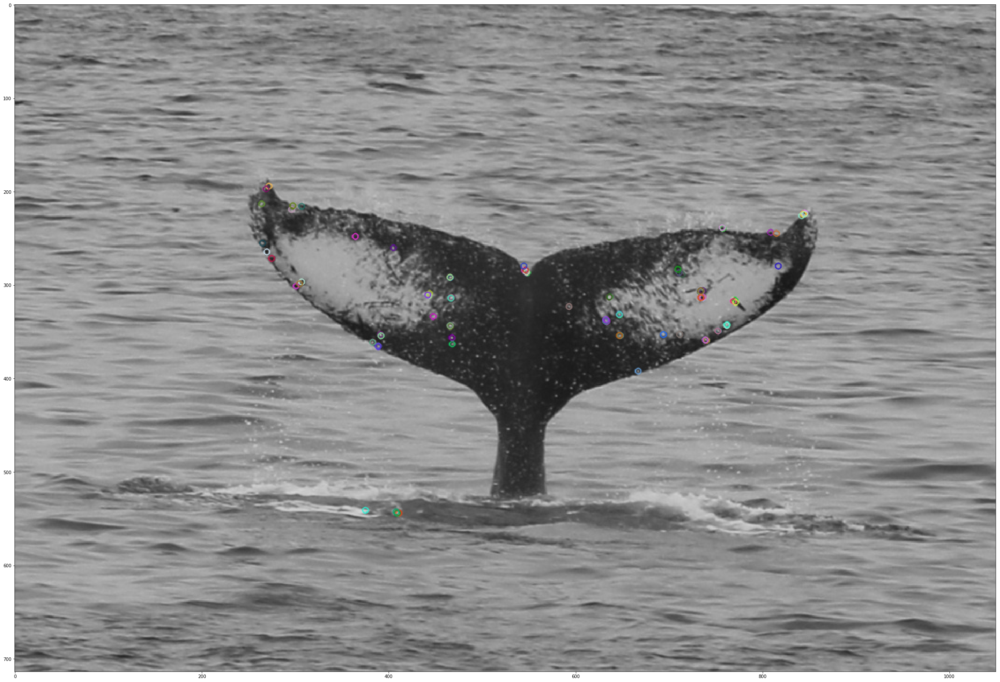

(<matplotlib.image.AxesImage at 0x7f91d03e7c50>, None)

In [143]:
plt.figure(figsize=(40,30))
plt.imshow(imgtest2,),plt.show()

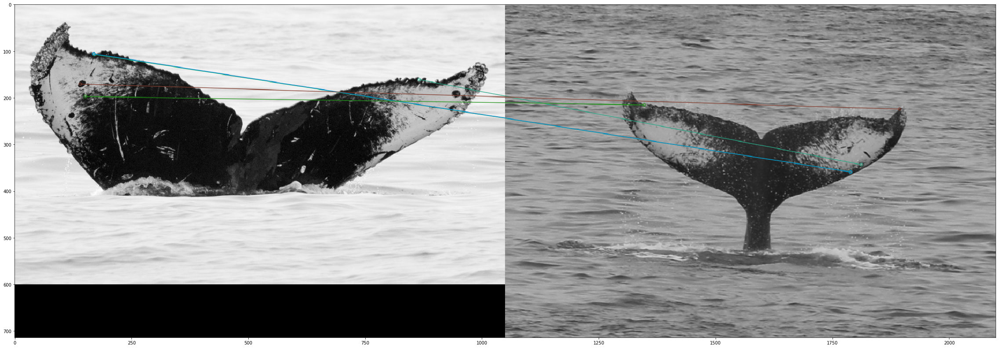

(<matplotlib.image.AxesImage at 0x7f91d046a6d8>, None)

In [145]:
plt.figure(figsize=(40,30))

bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors.
matches = bf.match(des1,des2)

# Sort them in the order of their distance.
matches = sorted(matches, key = lambda x:x.distance)

# Draw first 10 matches.
matchimg = cv2.drawMatches(img1,kp1,img2,kp2,matches[:5] ,None, flags=2)

plt.imshow(matchimg),plt.show()

In [100]:
des1[0]

array([224, 244, 185, 103, 241,  77, 117,  31, 122,  47,  45,  24, 246,
        23,  72,  48, 144,  30,  64,   8, 115, 124, 249,   3, 231, 157,
        20,  50,  64,  82, 198, 171], dtype=uint8)

In [101]:
des2[0]

array([140,  62, 155,  97, 178, 251,  51,  82, 180, 203, 110, 241, 175,
       167, 195, 184,   7, 118, 236,  16,  53, 157, 161,  42,  79, 231,
        52, 129, 226, 193,  15, 217], dtype=uint8)

# Random Forest Classifier

In [331]:
whichwhale = pd.concat([dfwhale,dfwhale2])

/home/ebicher/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [332]:
whichwhale = whichwhale.reset_index()

In [333]:
whichwhale.head(5)

,level_0,Id,Image,filtered,imgarray,index
0,0,w_23a388d,02bdec750.jpg,"[[254, 249, 229, 206, 176, 144, 116, 102, 97, ...","[[139, 150, 155, 145, 104, 68, 59, 59, 60, 52,...",275
1,1,w_23a388d,02f250971.jpg,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[[228, 237, 238, 237, 238, 238, 237, 237, 236,...",297
2,2,w_23a388d,03b6593e9.jpg,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[[211, 217, 215, 206, 202, 202, 198, 194, 209,...",377
3,3,w_23a388d,043b78dc6.jpg,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[[209, 209, 211, 211, 210, 211, 211, 208, 213,...",427
4,4,w_23a388d,09611f0c5.jpg,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[[190, 213, 212, 213, 212, 212, 213, 212, 212,...",953


In [334]:
whichwhale = whichwhale.drop(['level_0', 'Image', 'index'],1)

In [335]:
# Filter images and save in a column
kernel = np.ones((5,5),np.float32)/17
with tqdm(total=len(list(whichwhale.iterrows()))) as pbar:
    for index, row in whichwhale.iterrows():
        pbar.update(1)
        im = whichwhale.at[index, 'imgarray']
        filtered = cv2.filter2D(im,0,kernel)
        whichwhale.at[index, 'filtered'] = filtered
os.system('spd-say "Processing complete"')

100%|██████████| 42/42 [00:00<00:00, 418.74it/s]


0

In [336]:
whichwhale.tail()

,Id,filtered,imgarray
37,w_0369a5c,"[[211, 212, 214, 216, 218, 221, 220, 217, 212,...","[[137, 138, 148, 161, 163, 150, 139, 137, 119,..."
38,w_0369a5c,"[[221, 221, 220, 221, 221, 221, 221, 221, 221,...","[[149, 150, 150, 148, 149, 151, 152, 149, 149,..."
39,w_0369a5c,"[[216, 216, 215, 213, 212, 213, 214, 216, 217,...","[[139, 143, 148, 148, 143, 140, 143, 148, 151,..."
40,w_0369a5c,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[[180, 182, 181, 179, 179, 182, 181, 178, 174,..."
41,w_0369a5c,"[[222, 222, 221, 221, 220, 219, 218, 217, 217,...","[[141, 146, 151, 152, 152, 152, 154, 154, 154,..."


In [337]:
whichwhale['kp']=0
whichwhale['kp'] = whichwhale['kp'].astype(object)

whichwhale['des']=0
whichwhale['des'] = whichwhale['des'].astype(object)

In [338]:
# Init ORB
orb = cv2.ORB_create(nfeatures=150)

# Extract descriptors and put them in df
with tqdm(total=len(list(whichwhale.iterrows()))) as pbar:
    for index, row in whichwhale.iterrows():
        pbar.update(1)
        im = whichwhale.at[index, 'filtered']
        kp1, des1 = orb.detectAndCompute(im,None)
        whichwhale.at[index, 'kp'] = kp1
        whichwhale.at[index, 'des'] = des1
os.system('spd-say "Processing complete"')


100%|██████████| 42/42 [00:00<00:00, 121.62it/s]


0

In [339]:
whichwhale.head(5)

,Id,filtered,imgarray,kp,des
0,w_23a388d,"[[254, 249, 229, 206, 176, 144, 116, 102, 97, ...","[[139, 150, 155, 145, 104, 68, 59, 59, 60, 52,...","[<KeyPoint 0x7f917b622960>, <KeyPoint 0x7f917b...","[[130, 201, 30, 158, 56, 128, 42, 230, 188, 8,..."
1,w_23a388d,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[[228, 237, 238, 237, 238, 238, 237, 237, 236,...","[<KeyPoint 0x7f917b5f7db0>, <KeyPoint 0x7f917b...","[[2, 201, 2, 140, 20, 129, 172, 103, 4, 0, 88,..."
2,w_23a388d,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[[211, 217, 215, 206, 202, 202, 198, 194, 209,...","[<KeyPoint 0x7f917b5faa50>, <KeyPoint 0x7f917b...","[[2, 1, 70, 137, 124, 139, 168, 71, 46, 33, 21..."
3,w_23a388d,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[[209, 209, 211, 211, 210, 211, 211, 208, 213,...","[<KeyPoint 0x7f917b6006f0>, <KeyPoint 0x7f917b...","[[154, 205, 38, 188, 20, 130, 239, 247, 148, 2..."
4,w_23a388d,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[[190, 213, 212, 213, 212, 212, 213, 212, 212,...","[<KeyPoint 0x7f917b609390>, <KeyPoint 0x7f917b...","[[2, 141, 2, 140, 148, 131, 174, 103, 4, 1, 90..."


In [340]:
X = whichwhale['des']
y = whichwhale['Id']

In [341]:
len(whichwhale)

42

In [342]:
X.shape

(42,)

In [343]:
X[0].shape

(150, 32)

In [358]:
X[0][:]

array([[130, 201,  30, ...,  16,  33,   9],
       [ 19, 207,   2, ...,  10, 184, 136],
       [218, 140, 182, ..., 108, 252,  10],
       ...,
       [222,   6, 150, ..., 101,  47,  71],
       [  5,  87, 115, ..., 251, 226, 245],
       [185,   7, 101, ..., 139, 116,  96]], dtype=uint8)

In [354]:
fill = np.zeros(X[0][0].shape,np.uint8)
print(fill)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [346]:
features = pd.DataFrame.from_records(X)

In [347]:
features['Id'] = whichwhale['Id']

In [348]:
features.head(5)

,0,1,2,3,4,5,6,7,8,9,...,141,142,143,144,145,146,147,148,149,Id
0,"[130, 201, 30, 158, 56, 128, 42, 230, 188, 8, ...","[19, 207, 2, 142, 20, 135, 142, 231, 4, 8, 218...","[218, 140, 182, 252, 141, 242, 84, 175, 151, 1...","[172, 253, 189, 243, 253, 207, 255, 254, 223, ...","[2, 156, 178, 159, 119, 164, 184, 71, 190, 73,...","[89, 88, 126, 252, 38, 150, 127, 112, 173, 200...","[220, 165, 190, 243, 177, 111, 120, 91, 63, 18...","[164, 197, 45, 235, 156, 5, 207, 253, 86, 25, ...","[158, 70, 110, 189, 46, 34, 189, 122, 148, 150...","[121, 72, 107, 237, 36, 26, 111, 52, 101, 192,...",...,"[17, 189, 59, 97, 180, 207, 231, 119, 100, 104...","[90, 189, 18, 184, 27, 224, 24, 103, 191, 13, ...","[37, 44, 171, 201, 212, 231, 227, 71, 86, 201,...","[246, 250, 250, 184, 235, 249, 17, 202, 187, 1...","[61, 99, 107, 105, 84, 11, 231, 80, 112, 164, ...","[218, 156, 82, 252, 19, 192, 24, 103, 189, 15,...","[222, 6, 150, 184, 43, 123, 48, 66, 189, 159, ...","[5, 87, 115, 199, 244, 140, 239, 112, 253, 78,...","[185, 7, 101, 233, 20, 11, 75, 120, 85, 96, 24...",w_23a388d
1,"[2, 201, 2, 140, 20, 129, 172, 103, 4, 0, 88, ...","[0, 201, 130, 153, 84, 131, 172, 71, 22, 1, 90...","[66, 161, 82, 225, 122, 137, 248, 67, 171, 49,...","[146, 137, 6, 141, 92, 131, 168, 111, 174, 48,...","[96, 32, 240, 85, 108, 57, 248, 74, 235, 185, ...","[64, 96, 86, 141, 126, 137, 248, 72, 175, 32, ...","[2, 157, 34, 139, 213, 135, 174, 239, 14, 1, 8...","[3, 157, 2, 139, 151, 135, 190, 239, 6, 65, 73...","[98, 32, 116, 77, 124, 59, 232, 90, 109, 160, ...","[54, 160, 130, 157, 92, 131, 170, 105, 22, 160...",...,"[54, 241, 82, 235, 87, 79, 106, 236, 47, 33, 2...","[2, 195, 32, 140, 148, 129, 140, 167, 4, 5, 88...","[87, 64, 107, 199, 86, 2, 175, 112, 108, 195, ...","[128, 168, 130, 147, 204, 169, 168, 67, 172, 1...","[128, 40, 130, 145, 236, 169, 168, 66, 172, 19...","[148, 77, 2, 130, 212, 3, 238, 236, 21, 34, 15...","[2, 207, 2, 140, 150, 128, 190, 231, 4, 5, 90,...","[166, 172, 70, 157, 76, 139, 236, 235, 31, 162...","[163, 122, 233, 161, 237, 111, 197, 214, 83, 2...",w_23a388d
2,"[2, 1, 70, 137, 124, 139, 168, 71, 46, 33, 218...","[252, 56, 187, 116, 169, 109, 81, 18, 242, 191...","[212, 105, 159, 182, 26, 74, 23, 232, 180, 162...","[228, 187, 149, 119, 168, 12, 68, 185, 115, 18...","[120, 224, 145, 119, 9, 79, 68, 57, 115, 176, ...","[2, 128, 130, 155, 212, 163, 168, 67, 62, 3, 9...","[114, 33, 82, 129, 126, 9, 248, 67, 173, 32, 2...","[226, 32, 116, 193, 110, 137, 248, 67, 233, 49...","[34, 32, 96, 137, 108, 137, 232, 75, 143, 49, ...","[2, 12, 130, 155, 84, 163, 168, 67, 22, 3, 91,...",...,"[2, 167, 88, 235, 254, 233, 182, 191, 30, 61, ...","[111, 175, 162, 64, 225, 156, 122, 211, 43, 23...","[100, 169, 244, 248, 237, 45, 88, 155, 207, 57...","[252, 32, 214, 245, 168, 14, 124, 49, 185, 186...","[124, 112, 244, 113, 45, 61, 88, 158, 235, 185...","[75, 244, 224, 193, 246, 18, 252, 255, 63, 247...","[38, 12, 134, 158, 92, 34, 174, 105, 150, 130,...","[89, 241, 131, 170, 147, 141, 79, 149, 39, 5, ...","[116, 69, 194, 138, 156, 34, 238, 204, 13, 160...",w_23a388d
3,"[154, 205, 38, 188, 20, 130, 239, 247, 148, 2,...","[70, 1, 244, 147, 236, 32, 252, 143, 173, 19, ...","[2, 137, 34, 137, 213, 135, 170, 103, 6, 1, 88...","[90, 53, 112, 229, 114, 43, 120, 119, 41, 33, ...","[130, 132, 36, 153, 60, 129, 136, 111, 150, 83...","[102, 224, 240, 195, 236, 45, 250, 216, 11, 18...","[31, 197, 101, 203, 182, 19, 78, 189, 69, 81, ...","[198, 228, 214, 247, 232, 11, 126, 184, 187, 1...","[159, 151, 224, 235, 182, 18, 239, 189, 23, 97...","[60, 32, 122, 100, 118, 26, 75, 88, 97, 160, 2...",...,"[182, 105, 150, 158, 207, 137, 166, 194, 191, ...","[188, 109, 98, 239, 86, 18, 238, 121, 117, 160...","[214, 38, 215, 181, 236, 42, 234, 66, 189, 162...","[34, 157, 51, 154, 223, 245, 190, 239, 31, 69,...","[144, 207, 11, 187, 20, 131, 111, 247, 22, 0, ...","[88, 97, 214, 229, 40, 10, 88, 16, 169, 136, 1...","[86, 197, 66, 130, 148, 34, 206, 236, 9, 0, 15...","[6, 164, 216, 225, 191, 235, 178,

In [355]:
features.isnull().values.any()

True

In [353]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42 entries, 0 to 41
Columns: 151 entries, 0 to Id
dtypes: object(151)
memory usage: 49.6+ KB


In [356]:
#fill = np.zeros(32)
#print(fill)
features = features.fillna(fill, inplace=True)

ValueError: invalid fill value with a <class 'numpy.ndarray'>

In [279]:
X[1][1]

array([  0, 201, 130, 153,  84, 131, 172,  71,  22,   1,  90,   2, 168,
       202,  32,  64, 121,  42,  34, 144,  82, 186,  65, 215,  52,  38,
       154,  64, 149,  10, 176, 136], dtype=uint8)

In [300]:
X = features.drop('Id',1)
y = features['Id']

In [301]:
features.head(5)

,0,1,2,3,4,5,6,7,8,9,...,41,42,43,44,45,46,47,48,49,Id
0,"[2, 217, 50, 155, 93, 197, 186, 238, 158, 25, ...","[19, 207, 2, 142, 20, 135, 142, 231, 4, 8, 218...","[232, 188, 252, 117, 187, 255, 117, 191, 251, ...","[169, 75, 75, 237, 52, 135, 79, 180, 68, 72, 8...","[101, 57, 115, 70, 116, 29, 115, 112, 105, 232...","[253, 63, 245, 103, 249, 126, 127, 59, 105, 23...","[121, 72, 107, 237, 36, 26, 111, 52, 101, 192,...","[216, 188, 252, 117, 187, 254, 125, 191, 187, ...","[2, 217, 22, 159, 181, 133, 182, 239, 158, 9, ...","[101, 57, 249, 71, 124, 13, 107, 144, 235, 232...",...,"[159, 223, 6, 171, 180, 183, 238, 245, 148, 74...","[218, 173, 94, 255, 26, 193, 186, 96, 134, 180...","[185, 133, 105, 233, 20, 3, 75, 120, 85, 96, 2...","[60, 133, 106, 97, 212, 143, 199, 121, 69, 160...","[61, 96, 107, 105, 84, 27, 235, 88, 96, 224, 1...","[24, 149, 90, 252, 51, 200, 48, 103, 189, 1, 2...","[61, 99, 107, 105, 84, 11, 231, 80, 112, 164, ...","[37, 44, 171, 201, 212, 231, 227, 71, 86, 201,...","[218, 156, 82, 252, 19, 192, 24, 103, 189, 15,...",w_23a388d
1,"[188, 116, 114, 106, 119, 123, 210, 216, 125, ...","[96, 32, 240, 85, 108, 57, 248, 74, 235, 185, ...","[98, 32, 116, 77, 124, 59, 232, 90, 109, 160, ...","[54, 160, 130, 157, 92, 131, 170, 105, 22, 160...","[2, 157, 34, 139, 213, 135, 174, 239, 14, 1, 8...","[38, 161, 132, 153, 220, 129, 168, 203, 22, 17...","[92, 49, 48, 226, 169, 45, 94, 153, 235, 184, ...","[3, 157, 2, 139, 151, 135, 190, 239, 6, 65, 73...","[82, 160, 86, 149, 42, 137, 184, 71, 175, 33, ...","[64, 96, 86, 141, 126, 137, 248, 72, 175, 32, ...",...,"[2, 223, 18, 140, 150, 131, 190, 231, 12, 4, 9...","[178, 0, 98, 140, 92, 35, 232, 74, 21, 0, 241,...","[162, 0, 98, 140, 76, 35, 232, 75, 21, 35, 240...","[2, 223, 2, 140, 150, 131, 190, 231, 4, 5, 90,...","[0, 32, 130, 137, 204, 169, 168, 71, 174, 17, ...","[2, 168, 194, 145, 236, 169, 232, 71, 173, 19,...","[87, 64, 107, 199, 86, 2, 175, 112, 108, 195, ...","[2, 207, 2, 140, 150, 128, 190, 231, 4, 5, 90,...","[128, 40, 130, 145, 236, 169, 168, 66, 172, 19...",w_23a388d
2,"[2, 1, 70, 137, 124, 139, 168, 71, 46, 33, 218...","[252, 56, 187, 116, 169, 109, 81, 18, 242, 191...","[2, 129, 134, 159, 92, 131, 168, 105, 22, 17, ...","[228, 187, 149, 119, 168, 12, 68, 185, 115, 18...","[120, 224, 145, 119, 9, 79, 68, 57, 115, 176, ...","[224, 228, 149, 86, 109, 109, 68, 172, 235, 18...","[114, 33, 82, 129, 126, 9, 248, 67, 173, 32, 2...","[226, 32, 116, 193, 110, 137, 248, 67, 233, 49...","[34, 32, 96, 137, 108, 137, 232, 75, 143, 49, ...","[220, 44, 191, 116, 137, 108, 81, 2, 227, 254,...",...,"[104, 161, 192, 67, 1, 91, 68, 33, 99, 173, 17...","[3, 146, 229, 141, 118, 2, 185, 57, 14, 237, 8...","[72, 123, 17, 187, 160, 141, 15, 21, 60, 5, 19...","[108, 240, 244, 113, 169, 62, 120, 158, 123, 1...","[105, 115, 241, 76, 107, 31, 87, 29, 107, 172,...","[11, 158, 38, 149, 55, 240, 185, 55, 237, 79, ...","[111, 175, 162, 64, 225, 156, 122, 211, 43, 23...","[100, 169, 244, 248, 237, 45, 88, 155, 207, 57...","[124, 112, 244, 113, 45, 61, 88, 158, 235, 185...",w_23a388d
3,"[27, 13, 98, 190, 39, 242, 190, 99, 141, 66, 2...","[82, 0, 134, 141, 12, 35, 168, 99, 172, 129, 2...","[252, 48, 189, 112, 40, 109, 81, 24, 242, 191,...","[90, 53, 112, 229, 114, 43, 120, 119, 41, 33, ...","[31, 197, 101, 203, 182, 19, 78, 189, 69, 81, ...","[130, 144, 44, 217, 124, 133, 137, 91, 22, 25,...","[75, 189, 246, 213, 250, 189, 120, 183, 255, 2...","[66, 56, 82, 145, 98, 136, 184, 66, 173, 9, 11...","[198, 228, 214, 247, 232, 11, 126, 184, 187, 1...","[38, 36, 104, 202, 76, 33, 234, 72, 1, 162, 21...",...,"[105, 48, 252, 117, 33, 95, 81, 17, 107, 185, ...","[16, 141, 10, 191, 212, 162, 175, 231, 22, 1, ...","[16, 143, 11, 191, 212, 131, 238, 230, 30, 1, ...","[104, 48, 252, 101, 41, 30, 121, 16, 233, 249,...","[70, 129, 22, 139, 238, 0, 172, 77, 140, 16, 1...","[231, 48, 184, 217, 205, 125, 144, 138, 90, 63...","[88, 97, 214, 229, 40, 10, 88, 16, 169, 136, 1...","[144, 207, 11, 187, 20, 131, 111, 247, 22,

In [325]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import datasets
from sklearn import ensemble
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score

clf = RandomForestClassifier(n_jobs=-1)

clf.fit(X,y)


/home/ebicher/.local/lib/python3.6/site-packages/sklearn/ensemble/forest.py:248: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


ValueError: setting an array element with a sequence.

# Edge Detection

In [16]:
def auto_canny(image, sigma=0.33):
# compute the median of the single channel pixel intensities
    v = np.median(image)
 
    # apply automatic Canny edge detection using the computed median
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(image, lower, upper)
 
    # return the edged image
    return edged

In [17]:
imgs = [img1,img2,img3]

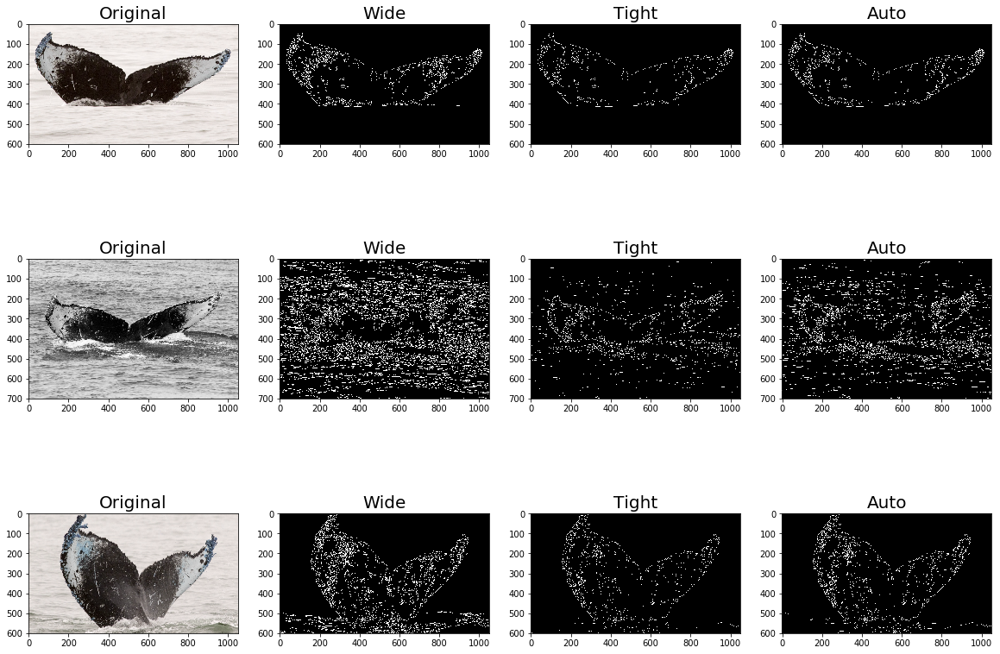

In [42]:
plt.figure(figsize=(20,20))
i = 1
#imgedges = []

# loop over the images
for image1 in imgs:
    # load the image, convert it to grayscale, and blur it slightly
    image = image1
    #gray = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    blurred = cv2.GaussianBlur(image, (3, 3), 0)
 
    # apply Canny edge detection using a wide threshold, tight
    # threshold, and automatically determined threshold
    wide = cv2.Canny(blurred, 10, 200)
    tight = cv2.Canny(blurred, 225, 250)
    auto = auto_canny(blurred)
 
    # show the images
    plt.subplot(4,4,i),plt.imshow(image1,cmap = 'gray')
    plt.title('Original', fontsize=20)

    plt.subplot(4,4,i+1),plt.imshow(wide,cmap = 'gray')
    plt.title('Wide', fontsize=20)
    
    plt.subplot(4,4,i+2),plt.imshow(tight,cmap = 'gray')
    plt.title('Tight', fontsize=20)

    plt.subplot(4,4,i+3),plt.imshow(auto,cmap = 'gray')
    plt.title('Auto', fontsize=20)
    i = i+4
    
    #plt.subplot(5,5,i+1)
    #plt.title(str(i), fontsize=20)
    #plt.imshow(dfwhale.at[i, 'imgarray'])
    
    #cv2.imshow("Original", image)
    #cv2.imshow("Edges", auto)
    #cv2.waitKey(0)
    #cv2.destroyAllWindows()

In [27]:
hsv = cv2.cvtColor(img1, cv2.COLOR_BGR2HSV)
# define range of blue color in HSV
lower_blue = np.array([0,0,0])
upper_blue = np.array([130,100,250])

# Threshold the HSV image to get only blue colors
mask = cv2.inRange(hsv, lower_blue, upper_blue)

# Bitwise-AND mask and original image
res = cv2.bitwise_and(img1,img1, mask= mask)

cv2.imshow('frame',img1)
cv2.imshow('mask',mask)
cv2.imshow('res',res)
cv2.waitKey(0)
cv2.destroyAllWindows()

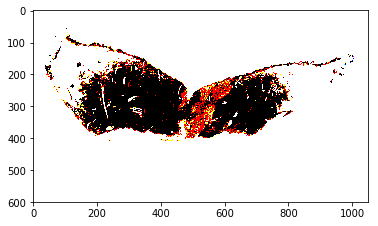

In [108]:
ret, th1 = cv2.threshold(img1,40,255,cv2.THRESH_BINARY)
plt.imshow(th1)

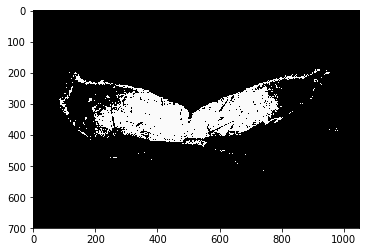

In [107]:
ret,th2 = cv2.threshold(img2,50,250,cv2.ADAPTIVE_THRESH_GAUSSIAN_C)
plt.imshow(th2)

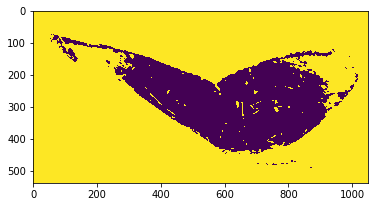

In [174]:
ret,th3 = cv2.threshold(img3,100,150,cv2.THRESH_BINARY)
plt.imshow(th3)

In [ ]:
def image_detect_and_compute(detector, img_name):
    """Detect and compute interest points and their descriptors."""
    img = cv2.imread(os.path.join(dataset_path, img_name))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    kp, des = detector.detectAndCompute(img, None)
    return img, kp, des
    

def draw_image_matches(detector, img1_name, img2_name, nmatches=10):
    """Draw ORB feature matches of the given two images."""
    img1, kp1, des1 = image_detect_and_compute(detector, img1_name)
    img2, kp2, des2 = image_detect_and_compute(detector, img2_name)
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key = lambda x: x.distance) # Sort matches by distance.  Best come first.
    
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:nmatches], img2, flags=2) # Show top 10 matches
    plt.figure(figsize=(16, 16))
    plt.title(type(detector))
    plt.imshow(img_matches); plt.show()

In [ ]:
img = img = dfwhale.at[22, 'imgarray']
cv2.imshow('ImageWindow', img)
cv2.waitKey()
cv2.destroyAllWindows()